# Deep Learning Small Project
Creating a model from scratch to classify covid-19 x-rays pictures

Members: Tiang Pei Yuan, Lim Yang Zhi, Heng Jing Han

# 0. Imports

In [1]:
# Matplotlib
import matplotlib.pyplot as plt
# Numpy
import numpy as np
# Pillow
from PIL import Image
# Torch
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms
from sklearn import metrics


# 1. Dataset object

## 1.1 Raw dataset for lung images

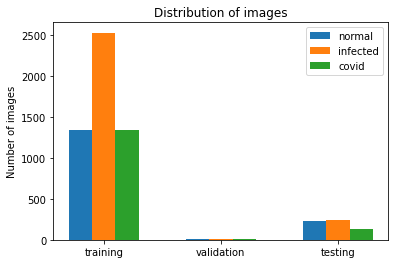

In [2]:
dataset_numbers = {'train_normal': 1341,\
                                'train_infected': 2530,\
                                'train_covid': 1345, \
                                'val_normal': 8,\
                                'val_infected': 8,\
                                'val_covid': 8, \
                                'test_normal': 234,\
                                'test_infected': 242, \
                                'test_covid': 138}


labels = ['training', 'validation', 'testing']
normal = [dataset_numbers['train_normal'], dataset_numbers['val_normal'], dataset_numbers['test_normal']]
infected = [dataset_numbers['train_infected'], dataset_numbers['val_infected'], dataset_numbers['test_infected']]
covid = [dataset_numbers['train_covid'], dataset_numbers['val_covid'], dataset_numbers['test_covid']]

x = np.arange(len(labels))  
width = 1  

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/5, normal, width/5, label='normal')
rects2 = ax.bar(x , infected, width/5, label='infected')
rects3 = ax.bar(x + width/5, covid, width/5, label='covid')


ax.set_ylabel('Number of images')
ax.set_title('Distribution of images')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

## 1.2 Data augmentation

In [3]:
from PIL import Image, ImageOps
import os
import numpy as np
import copy
import shutil

## Histogram equalization on images

In [4]:
try:
    os.makedirs('./dataset_he/train/normal')
except FileExistsError:
    pass
try:
    os.makedirs('./dataset_he/train/infected/non-covid')
except FileExistsError:
    pass
try:
    os.mkdir('./dataset_he/train/infected/covid')
except FileExistsError:
    pass
try:
    os.makedirs('./dataset_he/test/normal')
except FileExistsError:
    pass
try:
    os.makedirs('./dataset_he/test/infected/non-covid')
except FileExistsError:
    pass
try:
    os.mkdir('./dataset_he/test/infected/covid')
except FileExistsError:
    pass
try:
    os.makedirs('./dataset_he/val/normal')
except FileExistsError:
    pass
try:
    os.makedirs('./dataset_he/val/infected/non-covid')
except FileExistsError:
    pass
try:
    os.mkdir('./dataset_he/val/infected/covid')
except FileExistsError:
    pass


def histogram_equalization(src_folder, dst_folder):
    '''
    datatype: 'train', 'test', or 'val' (string)
    src_folder: folder for the original images (string)
    dst_folder: foledr to store images that have been applied histogram equalization (string)
    '''
    pre_string = './' + src_folder
    post_normal = '/normal'
    post_infected = '/infected/non-covid'
    post_covid = '/infected/covid'
    
    # PATH TO ORIGINAL IMAGES
    normal_path = pre_string + post_normal
    infected_path = pre_string + post_infected
    covid_path = pre_string + post_covid
    
    # PATH TO NEW AUGMENTED IMAGES
    dst_normal_path = './' + dst_folder + post_normal
    dst_infected_path = './' + dst_folder + post_infected
    dst_covid_path = './' + dst_folder + post_covid
    
    for file in os.listdir(normal_path):
        new_filename = dst_normal_path + '/' + file
        full_original_path = normal_path + '/' + file
        im = Image.open(full_original_path)
        im_mirror = ImageOps.equalize(im)
        im_mirror.save(new_filename)

        
    for file in os.listdir(infected_path):
        new_filename = dst_infected_path + '/' + file
        full_original_path = infected_path + '/' + file
        im = Image.open(full_original_path)
        im_mirror = ImageOps.equalize(im)
        im_mirror.save(new_filename)
        
        
    for file in os.listdir(covid_path):
        new_filename = dst_covid_path + '/' + file
        full_original_path = covid_path + '/' + file
        im = Image.open(full_original_path)
        im_mirror = ImageOps.equalize(im)
        im_mirror.save(new_filename)
        
    print('Done')


src_folder = './dataset/val'
dst_folder = './dataset_he/val'
histogram_equalization(src_folder, dst_folder)

src_folder = './dataset/test'
dst_folder = './dataset_he/test'
histogram_equalization(src_folder, dst_folder)

src_folder = './dataset/train'
dst_folder = './dataset_he/train'
histogram_equalization(src_folder, dst_folder)

Done
Done
Done


## Merge covid and non-covid images into a folder called not_normal

In [5]:
def make_new_infected(path_to_file):
    infected_path = path_to_file + 'infected/non-covid/'
    covid_path = path_to_file + 'infected/covid/'
    try:
        os.mkdir(path_to_file + 'not_normal')
    except FileExistsError:
        pass
    
    number_infected = len(next(os.walk(infected_path))[2])
    number_covid = len(next(os.walk(covid_path))[2])
    file_num = 0
    
    for file in os.listdir(infected_path):
        dst_path = path_to_file + 'not_normal/' + str(file_num) + '.jpg'
        src_path = infected_path + file 
        shutil.copy2(src_path, dst_path)
        file_num += 1
    
    for file in os.listdir(covid_path):
        dst_path = path_to_file + 'not_normal/' + str(file_num) + '.jpg'
        src_path = covid_path + file
        shutil.copy2(src_path, dst_path)
        file_num += 1
    print('Done')
        
src_path = './dataset_he/test/'
make_new_infected(src_path)
src_path = './dataset_he/train/'
make_new_infected(src_path)
src_path = './dataset_he/val/'
make_new_infected(src_path)

Done
Done
Done


## Mirroring augmented data

From the training dataset, we have 1341 normal images and 3875 infected images, which are quite unbalanced. In order to balance out the number of data for each class, we will be mirroring the normal ones to get more images. 

### WARNING: Do not run this code more than once, otherwise you will create duplicate images

In [9]:
def mirror_data(mirror_path):
    '''
    This function accepts a path and will produce a mirror for each image. Will result in twice the number of original files
    '''
    try:
        count_files = next(os.walk(mirror_path))[2] #count number of files in the directory
        number_of_files = len(count_files)
    except:
        number_of_files = 0
        for file in os.listdir(mirror_path):
            number_of_files += 1
    
    if number_of_files > 2600:
        print("Already mirrored, not mirroring again")
        return
    
    for file in os.listdir(mirror_path):
        full_image_path = mirror_path + '/' + file
        new_image_path = mirror_path + '/' + str(number_of_files) + '.jpg'
        
        im = Image.open(full_image_path)
        im_mirror = ImageOps.mirror(im)
        im_mirror.save(new_image_path)
        
        number_of_files += 1
    print('Done mirroring images for:', mirror_path)
    
mirror_data('./dataset_he/train/normal')
mirror_data('./dataset_he/train/infected/covid')

Already mirrored, not mirroring again
Done mirroring images for: ./dataset_he/train/infected/covid


### Dataset after pre-processing

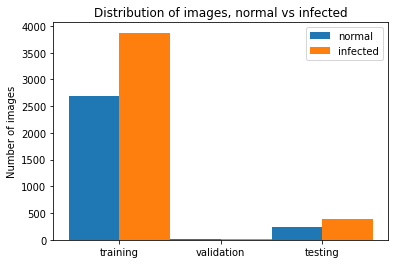

In [10]:
# Dataset containing images of normal vs infected
dataset_numbers = {'train_normal': 2682, \
                  'train_infected': 3875, \
                  'test_normal': 234, \
                  'test_infected': 381, \
                  'val_normal': 8, \
                  'val_infected': 17}

labels = ['training', 'validation', 'testing']
normal = [dataset_numbers['train_normal'], dataset_numbers['val_normal'], dataset_numbers['test_normal']]
infected = [dataset_numbers['train_infected'], dataset_numbers['val_infected'], dataset_numbers['test_infected']]
#covid = [dataset_numbers['train_covid'], dataset_numbers['val_covid'], dataset_numbers['test_covid']]

x = np.arange(len(labels))  
width = 1  

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/4, normal, width/2, label='normal')
rects2 = ax.bar(x + width/4, infected, width/2, label='infected')
#rects3 = ax.bar(x + width/5, covid, width/5, label='covid')


ax.set_ylabel('Number of images')
ax.set_title('Distribution of images, normal vs infected')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

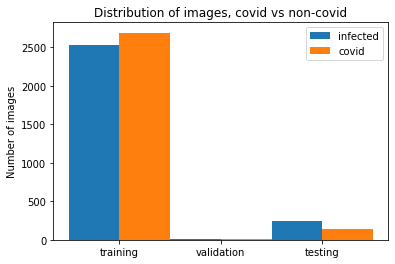

In [11]:
# Dataset containing images of normal vs infected
dataset_numbers = {'train_covid': 2690, \
                  'train_infected': 2530, \
                  'test_covid': 139, \
                  'test_infected': 242, \
                  'val_covid': 9, \
                  'val_infected': 8}

labels = ['training', 'validation', 'testing']
#normal = [dataset_numbers['train_normal'], dataset_numbers['val_normal'], dataset_numbers['test_normal']]
infected = [dataset_numbers['train_infected'], dataset_numbers['val_infected'], dataset_numbers['test_infected']]
covid = [dataset_numbers['train_covid'], dataset_numbers['val_covid'], dataset_numbers['test_covid']]

x = np.arange(len(labels))  
width = 1  

fig, ax = plt.subplots()
#rects1 = ax.bar(x - width/4, normal, width/2, label='normal')
rects2 = ax.bar(x - width/4, infected, width/2, label='infected')
rects3 = ax.bar(x + width/4, covid, width/2, label='covid')


ax.set_ylabel('Number of images')
ax.set_title('Distribution of images, covid vs non-covid')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

#### For the following code to work, please have full dataset in the same folder as this .ipynb file.

The following code creates new folders containing the images which have been augmented to have histogram equalization applied on them. The directory structure is the same as 'dataset' so that we can use these data easily 

In [13]:
class Lung_Dataset(Dataset):
    """
    Generic Dataset class.
    """
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'normal', 1: 'infected'}
        
        # The dataset has been split in training, testing and validation datasets
        self.groups = ['train', 'test', 'val']
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'train_normal': 2682,\
                                'train_infected': 3875,\
                                'val_normal': 8,\
                                'val_infected': 17,\
                                'test_normal': 234,\
                                'test_infected': 381}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'train_normal': './dataset_he/train/normal/',\
                              'train_infected': './dataset_he/train/not_normal/', \
                              'val_normal': './dataset_he/val/normal/',\
                              'val_infected': './dataset_he/val/not_normal/', \
                              'test_normal': './dataset_he/test/normal/',\
                              'test_infected': './dataset_he/test/not_normal/'}
        
        
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the Lung Dataset used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "Images have been split in three groups: training, testing and validation sets.\n"
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal', 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal' or 'infected'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            # Convert to Numpy array and normalize pixel values by dividing by 255.
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal', 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)

## 1.3.1 Train dataset

In [14]:
class Lung_Train_Dataset(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal and infected)
        self.classes = {0: 'normal', 1: 'infected'}
        
        # The dataset consists only of training images
        self.groups = 'train'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'train_normal': 2682,\
                                'train_infected': 3875}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'train_normal': './dataset_he/train/normal/',\
                              'train_infected': './dataset_he/train/not_normal/'}
        
      
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the training dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal', 'infected' or 'covid'"
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal', 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        if index < first_val:
            class_val = 'normal'
            label = torch.Tensor([1, 0])
        else:
            class_val = 'infected'
            index = index - first_val
            label = torch.Tensor([0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

In [15]:
ld_train = Lung_Train_Dataset()
ld_train.describe()

This is the training dataset of the Lung Dataset used for the Small Project in the 50.039 Deep Learning class in Feb-March 2021. 
It contains a total of 6557 images, of size 150 by 150.
The images are stored in the following locations and each one contains the following number of images:
 - train_normal, in folder ./dataset_he/train/normal/: 2682 images.
 - train_infected, in folder ./dataset_he/train/not_normal/: 3875 images.



In [16]:
print(len(ld_train))

6557


In [17]:
im, class_oh = ld_train[64]
print(im.shape)
print(im)
print(class_oh)

torch.Size([1, 150, 150])
tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
tensor([1., 0.])


## 1.3.2 Test dataset

In [18]:
class Lung_Test_Dataset(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'normal', 1: 'infected'}
        
        # The dataset consists only of test images
        self.groups = 'test'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'test_normal': 234,\
                                'test_infected': 381}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'test_normal': './dataset_he/test/normal/',\
                              'test_infected': './dataset_he/test/not_normal/'}
        
     
        
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the test dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal', 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal', 'infected' or 'covid'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        
        if index < first_val:
            class_val = 'normal'
            label = torch.Tensor([1, 0])
        else:
            class_val = 'infected'
            index = index - first_val
            label = torch.Tensor([0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

In [19]:
ld_test = Lung_Test_Dataset()
ld_test.describe()

This is the test dataset of the Lung Dataset used for the Small Project in the 50.039 Deep Learning class in Feb-March 2021. 
It contains a total of 615 images, of size 150 by 150.
The images are stored in the following locations and each one contains the following number of images:
 - test_normal, in folder ./dataset_he/test/normal/: 234 images.
 - test_infected, in folder ./dataset_he/test/not_normal/: 381 images.



In [20]:
print(len(ld_test))

615


In [21]:
im, class_oh = ld_test[18]
print(im.shape)
print(im)
print(class_oh)

torch.Size([1, 150, 150])
tensor([[[0.0314, 0.0275, 0.0275,  ..., 0.0784, 0.0706, 0.0627],
         [0.0314, 0.0275, 0.0275,  ..., 0.0784, 0.0706, 0.0627],
         [0.0314, 0.0275, 0.0275,  ..., 0.0784, 0.0706, 0.0627],
         ...,
         [0.0157, 0.0157, 0.0118,  ..., 0.0667, 0.0510, 0.0431],
         [0.0157, 0.0157, 0.0118,  ..., 0.0667, 0.0510, 0.0431],
         [0.0157, 0.0157, 0.0118,  ..., 0.0667, 0.0510, 0.0431]]])
tensor([1., 0.])


## 1.3.3 Validation dataset

In [22]:
class Lung_Val_Dataset(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'normal', 1: 'infected'}
        
        # The dataset consists only of validation images
        self.groups = 'val'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'val_normal': 8,\
                                'val_infected': 17}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'val_normal': './dataset_he/val/normal/',\
                              'val_infected': './dataset_he/val/not_normal/'}
        
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the validation dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal' or 'infected' or 'covid'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        
        if index < first_val:
            class_val = 'normal'
            label = torch.Tensor([1, 0])
        else:
            class_val = 'infected'
            index = index - first_val
            label = torch.Tensor([0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

In [23]:
ld_val = Lung_Val_Dataset()
ld_val.describe()

This is the validation dataset of the Lung Dataset used for the Small Project in the 50.039 Deep Learning class in Feb-March 2021. 
It contains a total of 25 images, of size 150 by 150.
The images are stored in the following locations and each one contains the following number of images:
 - val_normal, in folder ./dataset_he/val/normal/: 8 images.
 - val_infected, in folder ./dataset_he/val/not_normal/: 17 images.



In [24]:
print(len(ld_val))

25


In [25]:
im, class_oh = ld_val[3]
print(im.shape)
print(im)
print(class_oh)

torch.Size([1, 150, 150])
tensor([[[0.3255, 0.3020, 0.4353,  ..., 0.1804, 0.1804, 0.1647],
         [0.1451, 0.1922, 0.4353,  ..., 0.1765, 0.1843, 0.1725],
         [0.3608, 0.3529, 0.5412,  ..., 0.1882, 0.1961, 0.1843],
         ...,
         [0.0235, 0.0000, 0.0510,  ..., 0.0000, 0.0000, 0.0000],
         [0.0667, 0.0000, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
         [0.1176, 0.0078, 0.0039,  ..., 0.0000, 0.0000, 0.0000]]])
tensor([1., 0.])


## 1.3.4 Train dataset, for covid vs non-covid

In [26]:
class Lung_Train_Dataset_Infected(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal and infected)
        self.classes = {0: 'infected', 1: 'covid'}
        
        # The dataset consists only of training images
        self.groups = 'train'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'train_infected': 2530,\
                                'train_covid': 2690}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'train_infected': './dataset_he/train/infected/non-covid/',\
                              'train_covid': './dataset_he/train/infected/covid/'}
        
      
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the training dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal', 'infected' or 'covid'"
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal', 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        if index < first_val:
            class_val = 'infected'
            label = torch.Tensor([1, 0])
        else:
            class_val = 'covid'
            index = index - first_val
            label = torch.Tensor([0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

In [27]:
ld_train_infected = Lung_Train_Dataset_Infected()
ld_train_infected.describe()

This is the training dataset of the Lung Dataset used for the Small Project in the 50.039 Deep Learning class in Feb-March 2021. 
It contains a total of 5220 images, of size 150 by 150.
The images are stored in the following locations and each one contains the following number of images:
 - train_infected, in folder ./dataset_he/train/infected/non-covid/: 2530 images.
 - train_covid, in folder ./dataset_he/train/infected/covid/: 2690 images.



## 1.3.5 Test dataset, for covid vs non-covid

In [28]:
class Lung_Test_Dataset_Infected(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'infected', 1: 'covid'}
        
        # The dataset consists only of test images
        self.groups = 'test'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'test_infected': 242,\
                                'test_covid': 139}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'test_infected': './dataset_he/test/infected/non-covid/',\
                              'test_covid': './dataset_he/test/infected/covid/'}
        
     
        
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the test dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal', 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal', 'infected' or 'covid'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        
        if index < first_val:
            class_val = 'infected'
            label = torch.Tensor([1, 0])
        else:
            class_val = 'covid'
            index = index - first_val
            label = torch.Tensor([0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

In [29]:
ld_test_infected = Lung_Test_Dataset_Infected()
ld_test_infected.describe()

This is the test dataset of the Lung Dataset used for the Small Project in the 50.039 Deep Learning class in Feb-March 2021. 
It contains a total of 381 images, of size 150 by 150.
The images are stored in the following locations and each one contains the following number of images:
 - test_infected, in folder ./dataset_he/test/infected/non-covid/: 242 images.
 - test_covid, in folder ./dataset_he/test/infected/covid/: 139 images.



## 1.3.6 Validation dataset, for covid vs non-covid

In [30]:
class Lung_Val_Dataset_Infected(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'infected', 1: 'covid'}
        
        # The dataset consists only of validation images
        self.groups = 'val'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'val_infected': 8,\
                                'val_covid': 9}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'val_infected': './dataset_he/val/infected/non-covid/',\
                              'val_covid': './dataset_he/val/infected/covid/'}
        
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the validation dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal' or 'infected' or 'covid'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        
        if index < first_val:
            class_val = 'infected'
            label = torch.Tensor([1, 0])
        else:
            class_val = 'covid'
            index = index - first_val
            label = torch.Tensor([0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

In [31]:
ld_val_infected = Lung_Val_Dataset_Infected()
ld_val_infected.describe()

This is the validation dataset of the Lung Dataset used for the Small Project in the 50.039 Deep Learning class in Feb-March 2021. 
It contains a total of 17 images, of size 150 by 150.
The images are stored in the following locations and each one contains the following number of images:
 - val_infected, in folder ./dataset_he/val/infected/non-covid/: 8 images.
 - val_covid, in folder ./dataset_he/val/infected/covid/: 9 images.



# 2. Dataloader object

In [32]:
# Batch size value to be used (to be decided freely, but set to 4 for demo)
bs_val = 4

In [33]:
# Dataloader from dataset (train)
train_loader = DataLoader(ld_train, batch_size = bs_val, shuffle = True)
print(train_loader)

In [34]:
# Dataloader from dataset (test and val)
test_loader = DataLoader(ld_test, batch_size = bs_val, shuffle = True)
print(test_loader)
val_loader = DataLoader(ld_val, batch_size = bs_val, shuffle = True)
print(val_loader)

In [35]:
train_loader_infected = DataLoader(ld_train_infected, batch_size = bs_val, shuffle = True)
print(train_loader)
test_loader_infected = DataLoader(ld_test_infected, batch_size = bs_val, shuffle = True)
print(test_loader)
val_loader_infected = DataLoader(ld_val_infected, batch_size = bs_val, shuffle = True)
print(val_loader)

During the training, you will call for mini-batches using a for loop of some sort, probably similar to the one below.

Notice how each iteration of the for loop below produces a torch tensor of size [1, bs_val, 150, 150] in v[0] containing the bs_val = 4 images in the current mini-batch. You also have, in v[1], a torch tensor of size [bs_val, 2], containing the one hot vectors for each of the bs_val = 4 images.

We voluntarily interrupt it after one iteration of the mini-batch using an assert False.

In [36]:
# Typical mini-batch for loop on dataloader (train)
for k, v in enumerate(train_loader):
    print("-----")
    print(k)
    print(v[0])
    print(v[1])
    # Forced stop
    break
    #assert False, "Forced stop after one iteration of the for loop"

-----
0
tensor([[[[0.1765, 0.1725, 0.3333,  ..., 0.2235, 0.2078, 0.1961],
          [0.1843, 0.1765, 0.2706,  ..., 0.2118, 0.1961, 0.1882],
          [0.1922, 0.1804, 0.2000,  ..., 0.2000, 0.1843, 0.1725],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]],


        [[[0.0784, 0.0824, 0.0980,  ..., 0.1294, 0.1098, 0.0863],
          [0.0863, 0.0902, 0.1020,  ..., 0.1294, 0.1098, 0.0863],
          [0.0706, 0.0824, 0.1020,  ..., 0.1294, 0.1098, 0.0863],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]],


        [[[0.0196, 0.0745, 0.0000,  ..., 0.1686, 0.1804, 0.1765],
          [0.0039, 0.0627, 0.0000,  ..., 0.1882, 0.2039, 0.1922],
          [0.0039, 0.0667, 0.0

# 3. Neural Network

In [60]:
from __future__ import print_function
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.optim.lr_scheduler import StepLR
from tqdm import tqdm
import datetime
import numpy as np



class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, 3, 1)
        self.conv2 = nn.Conv2d(16, 32, 3, 1)
        self.conv3 = nn.Conv2d(32, 64, 3, 1)
        self.conv4 = nn.Conv2d(64, 64, 3, 1)
        self.conv5 = nn.Conv2d(64, 128, 3, 1)
        self.conv6 = nn.Conv2d(128, 128, 3, 1)
        self.conv7 = nn.Conv2d(256, 512, 3, 1)
        self.conv8 = nn.Conv2d(512, 512, 3, 1)
        
        self.dropout1 = nn.Dropout(0.2)
        self.dropout2 = nn.Dropout(0.3)
        self.dropout3 = nn.Dropout(0.4)
        self.fc1 = nn.Linear(100352, 128)
        self.fc3 = nn.Linear(128, 2)
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x,2)
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = F.max_pool2d(x,2)
        x = F.relu(self.conv5(x))
        x = self.dropout1(x)
        x = F.relu(self.conv6(x))
        x = F.relu(self.conv6(x))
        x = torch.flatten(x, 1)
#         print("After flatten:", x.shape)
        x = self.fc1(x)
        #print("After fc1:", x.shape)
        x = F.leaky_relu(x)
        #print("After fc2:", x.shape)
        x = self.fc3(x)
        #print("After fc3:", x.shape)
        output = F.log_softmax(x, dim=1)
        #print("Output:", output.shape)
        return output


def train(args, model, device, train_loader, optimizer, epoch):
    print('training now...')
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        
        output = model(data)
        #print(output.long())
        #print(torch.gt(target, 0))
        
        loss = nn.CrossEntropyLoss()
        loss = loss(output, torch.argmax(target, 1))
        
        loss.backward()
        optimizer.step()
        if batch_idx % args.log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
            if args.dry_run:
                break
                
    #save model at every epoch, avoid restarting training from scratch when there is an unexpected interruption
    model_name = "cnn_epoch" + str(epoch) + ".pt"
    torch.save(model.state_dict(), model_name)

    return loss.item()


def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            
#             test_loss += F.nll_loss(output, torch.argmax(target.long(), 1), reduction='sum').item()  # sum up batch loss
#             pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            
            test_loss += nn.CrossEntropyLoss()(output, torch.argmax(target.long(), 1)).item()
#             print(f"This is test_loss: {test_loss}")
            pred = output.argmax(dim=1, keepdim=True)
#             print(f"This is pred: {pred}")
#             print(torch.argmax(target, 1))
#             print(pred.eq(torch.argmax(target, 1).view_as(pred)).sum().item())

#             correct += pred.eq(target.view_as(pred)).sum().item()
            correct += pred.eq(torch.argmax(target, 1).view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
  
    return 100. * correct / len(test_loader.dataset), test_loss


def validate(model, device, val_loader):
    model.eval()
    val_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in val_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            
#             test_loss += F.nll_loss(output, torch.argmax(target.long(), 1), reduction='sum').item()  # sum up batch loss
#             pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            
            val_loss += nn.CrossEntropyLoss()(output, torch.argmax(target.long(), 1)).item()
#             print(f"This is test_loss: {test_loss}")
            pred = output.argmax(dim=1, keepdim=True)
#             print(f"This is pred: {pred}")
#             print(torch.argmax(target, 1))
#             print(pred.eq(torch.argmax(target, 1).view_as(pred)).sum().item())

#             correct += pred.eq(target.view_as(pred)).sum().item()
            correct += pred.eq(torch.argmax(target, 1).view_as(pred)).sum().item()

    val_loss /= len(val_loader.dataset)

    print('\nValidation set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        val_loss, correct, len(val_loader.dataset),
        100. * correct / len(val_loader.dataset)))
    
    return 100. * correct / len(val_loader.dataset), val_loss


class args:
  batch_size = 16 #'input batch size for training (default: 32)')
  test_batch_size = 1000 #'input batch size for testing (default: 1000)')
  epochs = 14 #'number of epochs to train (default: 14)') # 9~10 is good actually
  lr = 0.1 #'learning rate (default: 1.0)')
  gamma = 0.7 #'Learning rate step gamma (default: 0.7)')
  no_cuda = False #'disables CUDA training')
  dry_run = False #'quickly check a single pass')
  seed = 1 #'random seed (default: 1)')
  log_interval = 1000 #'how many batches to wait before logging training status')
  save_model = True #'For Saving the current Model')

use_cuda = not args.no_cuda and torch.cuda.is_available()

torch.manual_seed(args.seed)

device = torch.device("cuda" if use_cuda else "cpu")

train_kwargs = {'batch_size': args.batch_size}
test_kwargs = {'batch_size': args.test_batch_size}
if use_cuda:
    cuda_kwargs = {'num_workers': 1,
                   'pin_memory': True,
                   'shuffle': True}
    train_kwargs.update(cuda_kwargs)
    test_kwargs.update(cuda_kwargs)

## First model to differentiate normal vs infected

In [38]:
# Dataloader from dataset (train)
train_loader = DataLoader(ld_train, batch_size = bs_val, shuffle = True)

# Dataloader from dataset (test and val)
test_loader = DataLoader(ld_test, batch_size = bs_val, shuffle = True)

val_loader = DataLoader(ld_val, batch_size = bs_val, shuffle = True)

model = Net().to(device)
print(model)
optimizer = optim.Adadelta(model.parameters(), lr=args.lr)

start_time = datetime.datetime.now()
scheduler = StepLR(optimizer, step_size=1, gamma=args.gamma)

train_loss_list = []
val_loss_list = []
val_accuracy_list = []
test_loss_list = []
test_accuracy_list = []

for epoch in tqdm(range(1, args.epochs + 1)):
    train_loss = train(args, model, device, train_loader, optimizer, epoch)
    train_loss_list.append(train_loss)
    
    test_accuracy, test_loss = test(model, device, test_loader)
    test_loss_list.append(test_loss)
    test_accuracy_list.append(test_accuracy)
    
    val_accuracy, val_loss = validate(model, device, val_loader)
    val_loss_list.append(val_loss)
    val_accuracy_list.append(val_accuracy)
    
    scheduler.step()


end_time = datetime.datetime.now()
diff = end_time - start_time
print('-------------------------------------------------------------------------------------------')
print('Start time: ', start_time)
print('End time: ', end_time)
print('Time taken: ', diff.total_seconds() / 60, 'minutes')

torch.save(model.state_dict(), "model1_cnn_final.pt")



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

Net(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (conv6): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
  (conv7): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1))
  (conv8): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1))
  (dropout1): Dropout(p=0.2, inplace=False)
  (dropout2): Dropout(p=0.3, inplace=False)
  (dropout3): Dropout(p=0.4, inplace=False)
  (fc1): Linear(in_features=100352, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=2, bias=True)
)
training now...
Train Epoch: 1 [0/6557 (0%)]	Loss: 0.693118
Train Epoch: 1 [4000/6557 (61%)]	Loss: 0.021894


  7%|█████▉                                                                             | 1/14 [00:40<08:45, 40.41s/it]


Test set: Average loss: 0.2848, Accuracy: 456/615 (74%)


Validation set: Average loss: 0.4711, Accuracy: 20/25 (80%)

training now...
Train Epoch: 2 [0/6557 (0%)]	Loss: 0.453791
Train Epoch: 2 [4000/6557 (61%)]	Loss: 0.053736


 14%|███████████▊                                                                       | 2/14 [01:17<07:43, 38.64s/it]


Test set: Average loss: 0.2772, Accuracy: 471/615 (77%)


Validation set: Average loss: 0.1342, Accuracy: 21/25 (84%)

training now...
Train Epoch: 3 [0/6557 (0%)]	Loss: 0.002499
Train Epoch: 3 [4000/6557 (61%)]	Loss: 0.028207


 21%|█████████████████▊                                                                 | 3/14 [01:55<06:58, 38.08s/it]


Test set: Average loss: 0.2629, Accuracy: 458/615 (74%)


Validation set: Average loss: 0.1326, Accuracy: 20/25 (80%)

training now...
Train Epoch: 4 [0/6557 (0%)]	Loss: 0.032819
Train Epoch: 4 [4000/6557 (61%)]	Loss: 0.002253


 29%|███████████████████████▋                                                           | 4/14 [02:32<06:19, 37.93s/it]


Test set: Average loss: 0.2649, Accuracy: 468/615 (76%)


Validation set: Average loss: 0.1063, Accuracy: 21/25 (84%)

training now...
Train Epoch: 5 [0/6557 (0%)]	Loss: 0.000138
Train Epoch: 5 [4000/6557 (61%)]	Loss: 0.000465


 36%|█████████████████████████████▋                                                     | 5/14 [03:11<05:42, 38.08s/it]


Test set: Average loss: 0.3210, Accuracy: 457/615 (74%)


Validation set: Average loss: 0.0972, Accuracy: 21/25 (84%)

training now...
Train Epoch: 6 [0/6557 (0%)]	Loss: 0.000183
Train Epoch: 6 [4000/6557 (61%)]	Loss: 0.000018


 43%|███████████████████████████████████▌                                               | 6/14 [03:49<05:05, 38.14s/it]


Test set: Average loss: 0.2980, Accuracy: 475/615 (77%)


Validation set: Average loss: 0.1446, Accuracy: 20/25 (80%)

training now...
Train Epoch: 7 [0/6557 (0%)]	Loss: 0.008849
Train Epoch: 7 [4000/6557 (61%)]	Loss: 0.208334


 50%|█████████████████████████████████████████▌                                         | 7/14 [04:27<04:26, 38.09s/it]


Test set: Average loss: 0.3220, Accuracy: 471/615 (77%)


Validation set: Average loss: 0.1164, Accuracy: 22/25 (88%)

training now...
Train Epoch: 8 [0/6557 (0%)]	Loss: 0.000536
Train Epoch: 8 [4000/6557 (61%)]	Loss: 0.000088


 57%|███████████████████████████████████████████████▍                                   | 8/14 [05:05<03:47, 37.97s/it]


Test set: Average loss: 0.3851, Accuracy: 471/615 (77%)


Validation set: Average loss: 0.1640, Accuracy: 22/25 (88%)

training now...
Train Epoch: 9 [0/6557 (0%)]	Loss: 0.000001
Train Epoch: 9 [4000/6557 (61%)]	Loss: 0.000004


 64%|█████████████████████████████████████████████████████▎                             | 9/14 [05:42<03:09, 37.84s/it]


Test set: Average loss: 0.3778, Accuracy: 471/615 (77%)


Validation set: Average loss: 0.1547, Accuracy: 22/25 (88%)

training now...
Train Epoch: 10 [0/6557 (0%)]	Loss: 0.007433
Train Epoch: 10 [4000/6557 (61%)]	Loss: 0.000022


 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [06:20<02:31, 37.82s/it]


Test set: Average loss: 0.4777, Accuracy: 462/615 (75%)


Validation set: Average loss: 0.2799, Accuracy: 22/25 (88%)

training now...
Train Epoch: 11 [0/6557 (0%)]	Loss: 0.000031
Train Epoch: 11 [4000/6557 (61%)]	Loss: 0.000012


 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [06:58<01:53, 37.77s/it]


Test set: Average loss: 0.4287, Accuracy: 470/615 (76%)


Validation set: Average loss: 0.3065, Accuracy: 22/25 (88%)

training now...
Train Epoch: 12 [0/6557 (0%)]	Loss: 0.001333
Train Epoch: 12 [4000/6557 (61%)]	Loss: 0.000014


 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [07:35<01:15, 37.71s/it]


Test set: Average loss: 0.4958, Accuracy: 461/615 (75%)


Validation set: Average loss: 0.1559, Accuracy: 22/25 (88%)

training now...
Train Epoch: 13 [0/6557 (0%)]	Loss: 0.000026
Train Epoch: 13 [4000/6557 (61%)]	Loss: 0.000001


 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [08:12<00:37, 37.51s/it]


Test set: Average loss: 0.4762, Accuracy: 459/615 (75%)


Validation set: Average loss: 0.1320, Accuracy: 22/25 (88%)

training now...
Train Epoch: 14 [0/6557 (0%)]	Loss: 0.000009
Train Epoch: 14 [4000/6557 (61%)]	Loss: 0.000002


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [08:57<00:00, 38.41s/it]


Test set: Average loss: 0.4828, Accuracy: 461/615 (75%)


Validation set: Average loss: 0.3483, Accuracy: 22/25 (88%)

-------------------------------------------------------------------------------------------
Start time:  2021-03-20 13:39:50.605250
End time:  2021-03-20 13:48:48.279363
Time taken:  8.961235216666667 minutes


## 4.1 Model 1 Loss vs Epoch plot

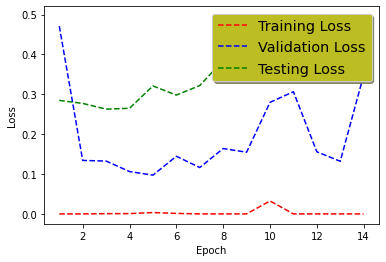

In [39]:
fig, ax = plt.subplots()
ax.plot(np.arange(1, args.epochs+1, 1), np.array(train_loss_list), 'r--', label='Training Loss')
ax.plot(np.arange(1, args.epochs+1, 1), np.array(val_loss_list), 'b--', label='Validation Loss')
ax.plot(np.arange(1, args.epochs+1, 1), np.array(test_loss_list), 'g--', label='Testing Loss')

legend = ax.legend(loc='upper right', shadow=True, fontsize='x-large')
legend.get_frame().set_facecolor('C8')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

## 4.2 Model 1 Accuracy vs Epoch plot

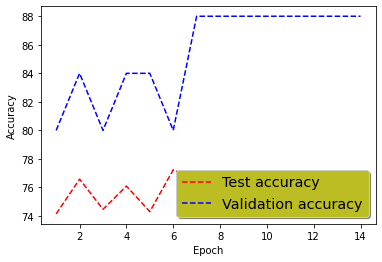

In [40]:
fig, ax = plt.subplots()
ax.plot(np.arange(1, args.epochs+1, 1), np.array(test_accuracy_list), 'r--', label='Test accuracy')
ax.plot(np.arange(1, args.epochs+1, 1), np.array(val_accuracy_list), 'b--', label='Validation accuracy')

legend = ax.legend(loc='lower right', shadow=True, fontsize='x-large')
legend.get_frame().set_facecolor('C8')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

## Second model to classify infected cases, covid vs non-covid

In [61]:
# Dataloader from dataset (train)
train_loader = DataLoader(ld_train_infected, batch_size = bs_val, shuffle = True)

# Dataloader from dataset (test and val)
test_loader = DataLoader(ld_test_infected, batch_size = bs_val, shuffle = True)

val_loader = DataLoader(ld_val_infected, batch_size = bs_val, shuffle = True)

model = Net().to(device)
print(model)
optimizer = optim.Adadelta(model.parameters(), lr=args.lr)

start_time = datetime.datetime.now()
scheduler = StepLR(optimizer, step_size=1, gamma=args.gamma)

train_loss_list = []
val_loss_list = []
val_accuracy_list = []
test_loss_list = []
test_accuracy_list = []

for epoch in tqdm(range(1, args.epochs + 1)):
    train_loss = train(args, model, device, train_loader, optimizer, epoch)
    train_loss_list.append(train_loss)
    
    test_accuracy, test_loss = test(model, device, test_loader)
    test_loss_list.append(test_loss)
    test_accuracy_list.append(test_accuracy)
    
    val_accuracy, val_loss = validate(model, device, val_loader)
    val_loss_list.append(val_loss)
    val_accuracy_list.append(val_accuracy)
    
    scheduler.step()


end_time = datetime.datetime.now()
diff = end_time - start_time
print('-------------------------------------------------------------------------------------------')
print('Start time: ', start_time)
print('End time: ', end_time)
print('Time taken: ', diff.total_seconds() / 60, 'minutes')

torch.save(model.state_dict(), "model_2-cnn_final.pt")



  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

Net(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (conv6): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
  (conv7): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1))
  (conv8): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1))
  (dropout1): Dropout(p=0.2, inplace=False)
  (dropout2): Dropout(p=0.3, inplace=False)
  (dropout3): Dropout(p=0.4, inplace=False)
  (fc1): Linear(in_features=100352, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=2, bias=True)
)
training now...
Train Epoch: 1 [0/5220 (0%)]	Loss: 0.693202
Train Epoch: 1 [4000/5220 (77%)]	Loss: 0.693335


  7%|█████▉                                                                             | 1/14 [00:28<06:10, 28.47s/it]


Test set: Average loss: 0.1759, Accuracy: 139/381 (36%)


Validation set: Average loss: 0.2029, Accuracy: 9/17 (53%)

training now...
Train Epoch: 2 [0/5220 (0%)]	Loss: 0.684861
Train Epoch: 2 [4000/5220 (77%)]	Loss: 0.682236


 14%|███████████▊                                                                       | 2/14 [00:57<05:46, 28.86s/it]


Test set: Average loss: 0.1761, Accuracy: 139/381 (36%)


Validation set: Average loss: 0.2046, Accuracy: 9/17 (53%)

training now...
Train Epoch: 3 [0/5220 (0%)]	Loss: 0.704235
Train Epoch: 3 [4000/5220 (77%)]	Loss: 0.693438


 21%|█████████████████▊                                                                 | 3/14 [01:26<05:17, 28.90s/it]


Test set: Average loss: 0.1764, Accuracy: 139/381 (36%)


Validation set: Average loss: 0.2025, Accuracy: 9/17 (53%)

training now...
Train Epoch: 4 [0/5220 (0%)]	Loss: 0.681065
Train Epoch: 4 [4000/5220 (77%)]	Loss: 0.678334


 29%|███████████████████████▋                                                           | 4/14 [01:56<04:53, 29.30s/it]


Test set: Average loss: 0.1765, Accuracy: 139/381 (36%)


Validation set: Average loss: 0.2048, Accuracy: 9/17 (53%)

training now...
Train Epoch: 5 [0/5220 (0%)]	Loss: 0.706748
Train Epoch: 5 [4000/5220 (77%)]	Loss: 0.690520


 36%|█████████████████████████████▋                                                     | 5/14 [02:26<04:27, 29.67s/it]


Test set: Average loss: 0.1701, Accuracy: 278/381 (73%)


Validation set: Average loss: 0.1979, Accuracy: 11/17 (65%)

training now...
Train Epoch: 6 [0/5220 (0%)]	Loss: 0.724938
Train Epoch: 6 [4000/5220 (77%)]	Loss: 0.120285


 43%|███████████████████████████████████▌                                               | 6/14 [02:57<03:58, 29.86s/it]


Test set: Average loss: 0.1066, Accuracy: 320/381 (84%)


Validation set: Average loss: 0.1542, Accuracy: 11/17 (65%)

training now...
Train Epoch: 7 [0/5220 (0%)]	Loss: 0.147268
Train Epoch: 7 [4000/5220 (77%)]	Loss: 1.014972


 50%|█████████████████████████████████████████▌                                         | 7/14 [03:25<03:26, 29.54s/it]


Test set: Average loss: 0.1064, Accuracy: 319/381 (84%)


Validation set: Average loss: 0.1476, Accuracy: 12/17 (71%)

training now...
Train Epoch: 8 [0/5220 (0%)]	Loss: 0.460380
Train Epoch: 8 [4000/5220 (77%)]	Loss: 0.214631


 57%|███████████████████████████████████████████████▍                                   | 8/14 [03:54<02:56, 29.35s/it]


Test set: Average loss: 0.1059, Accuracy: 326/381 (86%)


Validation set: Average loss: 0.1564, Accuracy: 11/17 (65%)

training now...
Train Epoch: 9 [0/5220 (0%)]	Loss: 0.360545
Train Epoch: 9 [4000/5220 (77%)]	Loss: 0.223252


 64%|█████████████████████████████████████████████████████▎                             | 9/14 [04:24<02:26, 29.38s/it]


Test set: Average loss: 0.1026, Accuracy: 319/381 (84%)


Validation set: Average loss: 0.1606, Accuracy: 11/17 (65%)

training now...
Train Epoch: 10 [0/5220 (0%)]	Loss: 0.398690
Train Epoch: 10 [4000/5220 (77%)]	Loss: 0.060853


 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [04:53<01:57, 29.27s/it]


Test set: Average loss: 0.0960, Accuracy: 332/381 (87%)


Validation set: Average loss: 0.1642, Accuracy: 10/17 (59%)

training now...
Train Epoch: 11 [0/5220 (0%)]	Loss: 1.026942
Train Epoch: 11 [4000/5220 (77%)]	Loss: 0.344245


 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [05:23<01:28, 29.51s/it]


Test set: Average loss: 0.1009, Accuracy: 321/381 (84%)


Validation set: Average loss: 0.1646, Accuracy: 13/17 (76%)

training now...
Train Epoch: 12 [0/5220 (0%)]	Loss: 0.649691
Train Epoch: 12 [4000/5220 (77%)]	Loss: 0.632967


 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [05:52<00:58, 29.38s/it]


Test set: Average loss: 0.1045, Accuracy: 317/381 (83%)


Validation set: Average loss: 0.1804, Accuracy: 13/17 (76%)

training now...
Train Epoch: 13 [0/5220 (0%)]	Loss: 0.202352
Train Epoch: 13 [4000/5220 (77%)]	Loss: 0.645480


 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [06:21<00:29, 29.19s/it]


Test set: Average loss: 0.0982, Accuracy: 329/381 (86%)


Validation set: Average loss: 0.1622, Accuracy: 10/17 (59%)

training now...
Train Epoch: 14 [0/5220 (0%)]	Loss: 0.319620
Train Epoch: 14 [4000/5220 (77%)]	Loss: 0.069931


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [06:50<00:00, 29.33s/it]


Test set: Average loss: 0.1036, Accuracy: 323/381 (85%)


Validation set: Average loss: 0.1498, Accuracy: 13/17 (76%)

-------------------------------------------------------------------------------------------
Start time:  2021-03-20 14:13:56.893178
End time:  2021-03-20 14:20:47.550910
Time taken:  6.844295533333334 minutes


# 5.1 Loss vs Epoch plot

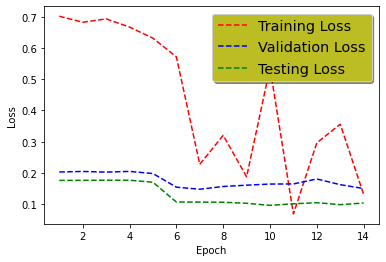

In [62]:
fig, ax = plt.subplots()
ax.plot(np.arange(1, args.epochs+1, 1), np.array(train_loss_list), 'r--', label='Training Loss')
ax.plot(np.arange(1, args.epochs+1, 1), np.array(val_loss_list), 'b--', label='Validation Loss')
ax.plot(np.arange(1, args.epochs+1, 1), np.array(test_loss_list), 'g--', label='Testing Loss')

legend = ax.legend(loc='upper right', shadow=True, fontsize='x-large')
legend.get_frame().set_facecolor('C8')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

# 5.2 Accuracy vs Epoch plot

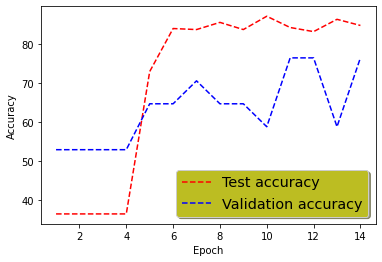

In [63]:
fig, ax = plt.subplots()
ax.plot(np.arange(1, args.epochs+1, 1), np.array(test_accuracy_list), 'r--', label='Test accuracy')
ax.plot(np.arange(1, args.epochs+1, 1), np.array(val_accuracy_list), 'b--', label='Validation accuracy')

legend = ax.legend(loc='lower right', shadow=True, fontsize='x-large')
legend.get_frame().set_facecolor('C8')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# 6. Performance on Validation Set

Average performance: 22/25 = 88.0%


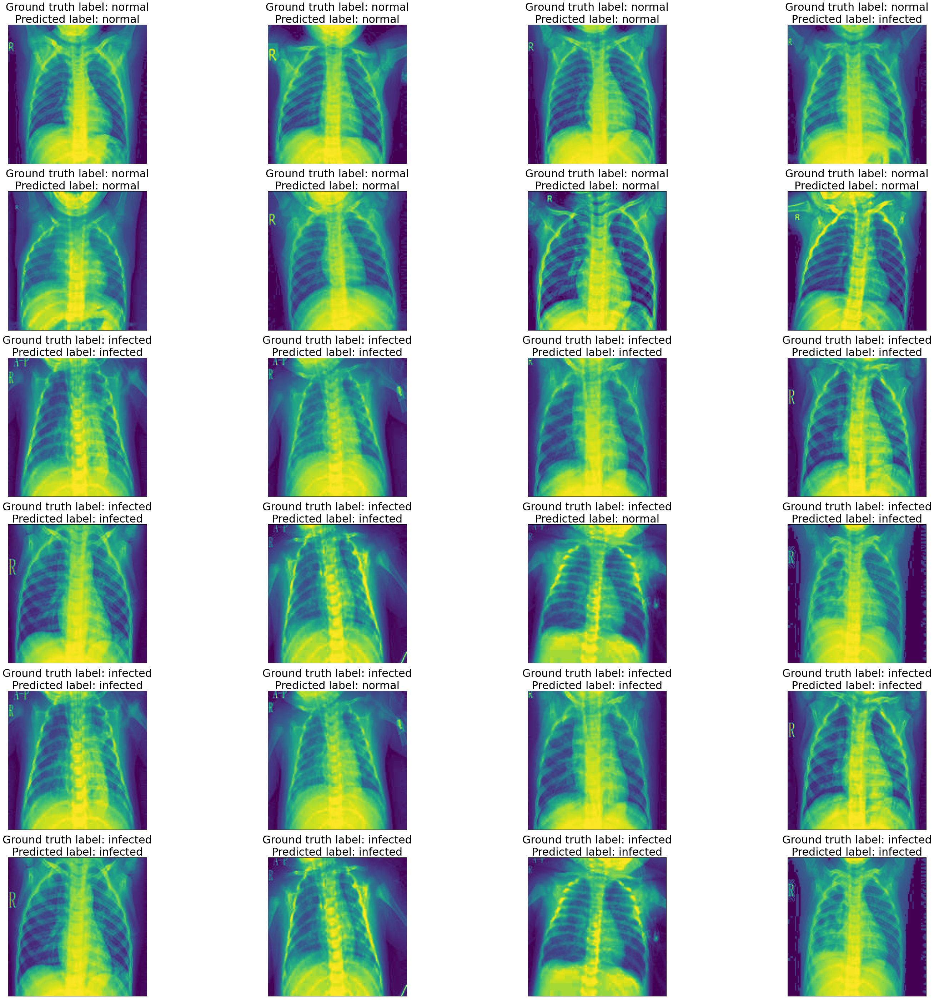

[[15  2]
 [ 1  7]]
              precision    recall  f1-score   support

    infected      0.938     0.882     0.909        17
      normal      0.778     0.875     0.824         8

    accuracy                          0.880        25
   macro avg      0.858     0.879     0.866        25
weighted avg      0.886     0.880     0.882        25



In [64]:
model = Net().to(device)
model.load_state_dict(torch.load("./model1_cnn_final.pt"))
classes = {0: 'normal', 1: 'infected'}

val_loader = DataLoader(ld_val, batch_size = 1, shuffle = False)
val_pred_list = []
with torch.no_grad():
    for data, target in val_loader: 
        data, target = data.to(device), target.to(device)
        output = model(data)
        pred = output.argmax(dim=1, keepdim=True)
        val_pred_list.append(classes[int(pred)])
    

class_val = ["normal","normal","normal","normal","normal","normal","normal","normal",
             "infected","infected","infected","infected","infected","infected","infected","infected",
            "infected","infected","infected","infected","infected","infected","infected","infected", "infected"]
accuracy = 0
for label_index in range(len(val_pred_list)):
    if (val_pred_list[label_index] == class_val[label_index]):
        accuracy += 1
        
print("Average performance: " + str(accuracy) + "/" + str(len(val_pred_list)) + " = " + str(100 * accuracy/len(val_pred_list)) + "%")

f = plt.figure(figsize=(50, 50))
axes = []

for a in range(3*8):
    
    classes = class_val[a]

    axes.append(f.add_subplot(6, 4, a+1))
    
    plt.xticks([], [])
    plt.yticks([], [])
    
    subplot_title = ("Ground truth label: " + classes + "\nPredicted label: " + val_pred_list[a])
    axes[-1].set_title(subplot_title, size = 30)
    ld_val.show_img("val", classes, a%8)
    

plt.show()

print(metrics.confusion_matrix(class_val, val_pred_list))
print(metrics.classification_report(class_val, val_pred_list, digits=3))

## Performance on validation set, model 2

Average performance: 13/17 = 76.47058823529412%


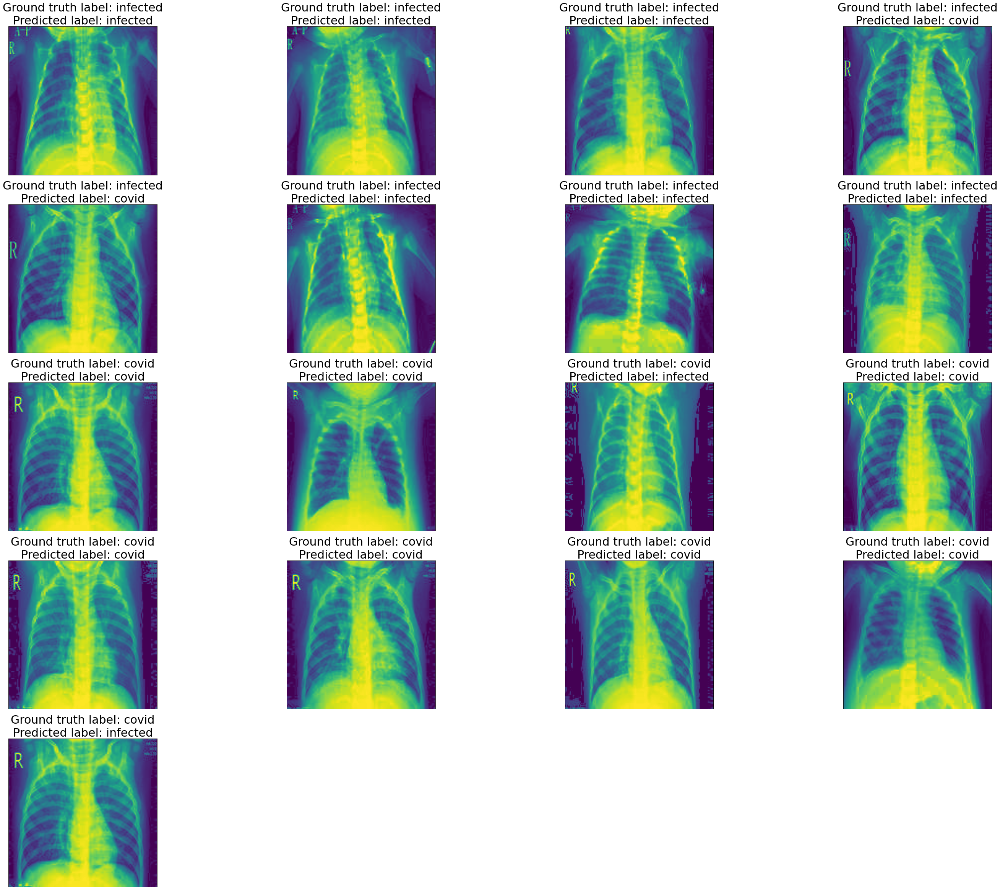

[[7 2]
 [2 6]]
              precision    recall  f1-score   support

       covid      0.778     0.778     0.778         9
    infected      0.750     0.750     0.750         8

    accuracy                          0.765        17
   macro avg      0.764     0.764     0.764        17
weighted avg      0.765     0.765     0.765        17



In [65]:
model = Net().to(device)
model.load_state_dict(torch.load("./model_2-cnn_final.pt"))
classes = {0: 'infected', 1: 'covid'}

val_loader = DataLoader(ld_val_infected, batch_size = 1, shuffle = False)
val_pred_list = []
with torch.no_grad():
    for data, target in val_loader: 
        data, target = data.to(device), target.to(device)
        output = model(data)
        pred = output.argmax(dim=1, keepdim=True)
        val_pred_list.append(classes[int(pred)])
    

class_val = ["infected","infected","infected","infected","infected","infected","infected","infected",
            "covid","covid","covid","covid","covid","covid","covid","covid", "covid"]
accuracy = 0
for label_index in range(len(val_pred_list)):
    if (val_pred_list[label_index] == class_val[label_index]):
        accuracy += 1
        
print("Average performance: " + str(accuracy) + "/" + str(len(val_pred_list)) + " = " + str(100 * accuracy/len(val_pred_list)) + "%")

f = plt.figure(figsize=(50, 50))
axes = []

for a in range(17):
    
    classes = class_val[a]

    axes.append(f.add_subplot(6, 4, a+1))
    
    plt.xticks([], [])
    plt.yticks([], [])
    
    subplot_title = ("Ground truth label: " + classes + "\nPredicted label: " + val_pred_list[a])
    axes[-1].set_title(subplot_title, size = 30)
    ld_val_infected.show_img("val", classes, a%8)
    

plt.show()

print(metrics.confusion_matrix(class_val, val_pred_list))
print(metrics.classification_report(class_val, val_pred_list, digits=3))

## 7. Loader Function

### Special dataloader for testing accuracy

In [66]:
class Final_Testing_Dataset(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'normal', 1: 'infected', 2: 'covid'}
        
        # The dataset consists only of test images
        self.groups = 'val'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'val_normal': 8,\
                                'val_infected': 8, \
                                'val_covid': 9}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'val_normal': './dataset_he/val/normal/', \
                              'val_infected': './dataset_he/val/infected/non-covid/', \
                              'val_covid': './dataset_he/val/infected/covid/'}
        

    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the test dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal', 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal', 'infected' or 'covid'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        second_val = first_val + int(list(self.dataset_numbers.values())[1])
        if index < first_val:
            class_val = 'normal'
            label = torch.Tensor([1, 0, 0])
        elif index >= first_val and index < second_val:
            class_val = 'infected'
            index = index - first_val
            label = torch.Tensor([0, 1, 0])
        else:
            class_val = 'covid'
            index = index - second_val
            label = torch.Tensor([0, 0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

In [67]:
ld_final_test = Final_Testing_Dataset()
ld_final_test.describe()
print(len(ld_final_test))

This is the test dataset of the Lung Dataset used for the Small Project in the 50.039 Deep Learning class in Feb-March 2021. 
It contains a total of 25 images, of size 150 by 150.
The images are stored in the following locations and each one contains the following number of images:
 - val_normal, in folder ./dataset_he/val/normal/: 8 images.
 - val_infected, in folder ./dataset_he/val/infected/non-covid/: 8 images.
 - val_covid, in folder ./dataset_he/val/infected/covid/: 9 images.

25


Model 1 statistics:

Validation set: Average loss: 0.2679, Accuracy: 23/25 (92%)

Model 2 statistics:

Validation set: Average loss: 0.6122, Accuracy: 13/17 (76%)

Combined models, average performance: 9/25 = 36.0%


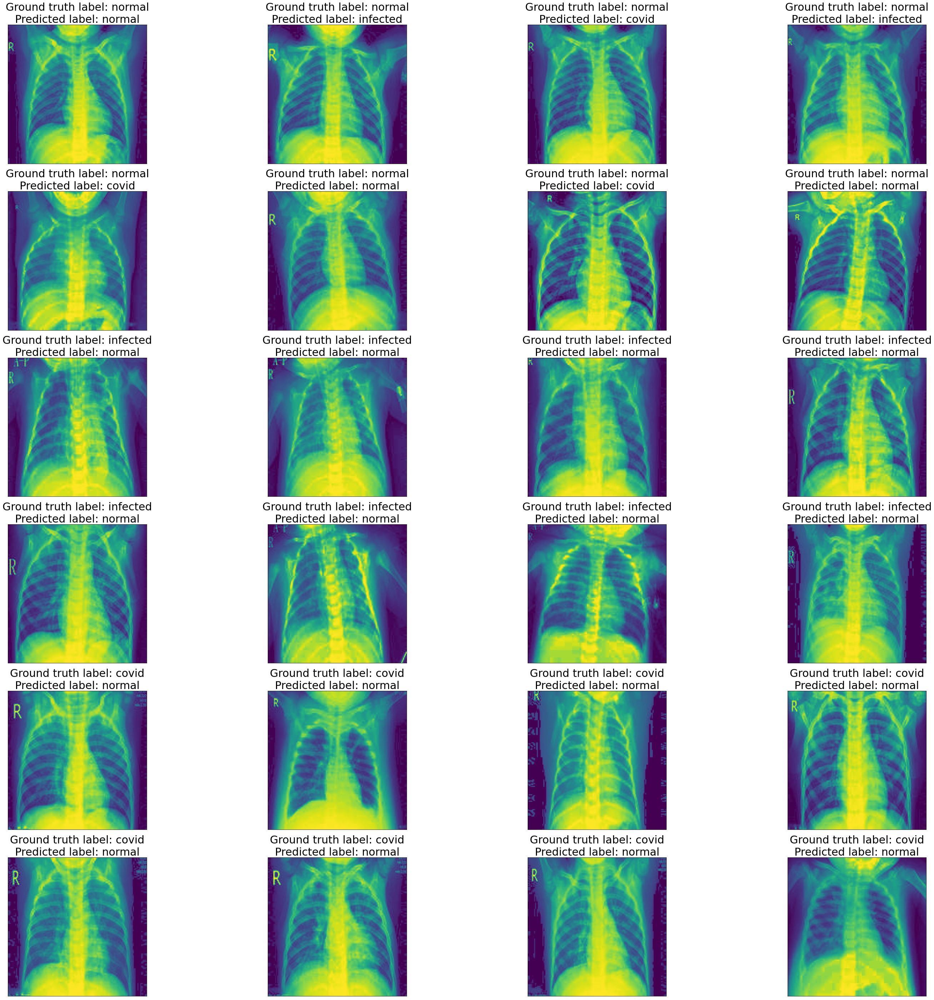

In [68]:
def loader_function(model1_abs_path, model2_abs_path):
    '''
    Input:
    - absolute path of model 1
    - absolute path of model 2
    
    This function uses model 1 to predict the validation set normal and infected images. From there, images that are classified
    as infected will go through the second model to be predicted.
    
    Once prediction is complete, function will print the images with their ground truth label and the predicted label
    '''
    class args:
      batch_size = 16 #'input batch size for training (default: 32)')
      test_batch_size = 1000 #'input batch size for testing (default: 1000)')
      epochs = 14 #'number of epochs to train (default: 14)') # 9~10 is good actually
      lr = 0.8 #'learning rate (default: 1.0)')
      gamma = 0.7 #'Learning rate step gamma (default: 0.7)')
      no_cuda = False #'disables CUDA training')
      dry_run = False #'quickly check a single pass')
      seed = 1 #'random seed (default: 1)')
      log_interval = 1000 #'how many batches to wait before logging training status')
      save_model = True #'For Saving the current Model')

    use_cuda = not args.no_cuda and torch.cuda.is_available()
    device = torch.device("cuda" if use_cuda else "cpu")

    ####### MODEL 1 #######
    model1 = Net().to(device)
    model1.load_state_dict(torch.load(model1_abs_path))

    bs_val = 1
    # Dataloader from dataset (test and val)
    # test_loader = DataLoader(ld_test, batch_size = bs_val, shuffle = True)
    val_loader = DataLoader(ld_val, batch_size = bs_val, shuffle = True)

    val_loss_list = []
    val_accuracy_list = []
#     test_loss_list = []
#     test_accuracy_list = []
    
    print("Model 1 statistics:")
#     test_accuracy, test_loss = test(model1, device, test_loader)
#     test_loss_list.append(test_loss)
#     test_accuracy_list.append(test_accuracy)

    val_accuracy, val_loss = validate(model1, device, val_loader)
    val_loss_list.append(val_loss)
    val_accuracy_list.append(val_accuracy)
    
    ####### MODEL 2 #######
    model2 = Net().to(device)
    model2.load_state_dict(torch.load(model2_abs_path))

    # Dataloader from dataset (test and val)
    # test_loader_infected = DataLoader(ld_test_infected, batch_size = bs_val, shuffle = True)
    val_loader_infected = DataLoader(ld_val_infected, batch_size = bs_val, shuffle = True)

    val_loss_list_infected = []
    val_accuracy_list_infected = []
    # test_loss_list_infected = []
    # test_accuracy_list_infected = []

    print("Model 2 statistics:")
#     test_accuracy_infected, test_loss_infected = test(model2, device, test_loader_infected)
#     test_loss_list_infected.append(test_loss_infected)
#     test_accuracy_list_infected.append(test_accuracy_infected)

    val_accuracy_infected, val_loss_infected = validate(model2, device, val_loader_infected)
    val_loss_list_infected.append(val_loss_infected)
    val_accuracy_list_infected.append(val_accuracy_infected)
    
    
    final_test_loader = DataLoader(ld_final_test, batch_size = bs_val, shuffle=True)
    
    # PREDICT AND PRINT THE IMAGES    
    classes_orig = {0: 'normal', 1: 'infected', 2: 'covid'}
    classes1 = {0: 'normal', 1: 'infected'}
    classes2 = {0: 'infected', 1: 'covid'}
    
    val_pred = []
    
    class_val = ["normal", "normal", "normal", "normal", "normal", "normal", "normal", "normal", 
                 "infected", "infected", "infected", "infected", "infected", "infected", "infected", "infected",
                 "covid", "covid", "covid", "covid", "covid", "covid", "covid", "covid", "covid"]
    
    with torch.no_grad():
        for data, target in final_test_loader: 
            data, target = data.to(device), target.to(device)
            output = model1(data)
            pred = output.argmax(dim=1, keepdim=True)
            
            if (classes1[int(pred)] == 'infected'):
                output = model2(data)
                pred = output.argmax(dim=1, keepdim=True)
                val_pred.append(classes2[int(pred)])
            else:
                val_pred.append(classes1[int(pred)])
    
    accuracy = 0
    
    f = plt.figure(figsize=(50, 50))
    axes = []

    for a in range(8):

        classes = class_val[a]

        axes.append(f.add_subplot(6, 4, a+1))

        plt.xticks([], [])
        plt.yticks([], [])

        subplot_title = ("Ground truth label: " + classes + "\nPredicted label: " + val_pred[a])
        axes[-1].set_title(subplot_title, size = 30)
        ld_val.show_img("val", classes, a%8)

    for b in range(8, 24):
        classes = class_val[b]
        
        axes.append(f.add_subplot(6, 4, b+1))
        
        plt.xticks([], [])
        plt.yticks([], [])
        
        subplot_title = ("Ground truth label: " + classes + "\nPredicted label: " + val_pred[a])
        axes[-1].set_title(subplot_title, size = 30)
        ld_val_infected.show_img("val", classes, b%8)
        
#     print(len(val_pred), val_pred)
#     print(len(class_val), class_val)
    for label_index in range(len(val_pred)):
        if (val_pred[label_index] == class_val[label_index]):
            accuracy += 1

    print("Combined models, average performance: " + str(accuracy) + "/" + str(len(val_pred)) + " = " + str(100 * accuracy/len(val_pred)) + "%")
    plt.show()


    
loader_function(model1_abs_path='./binaryclass_cnn1.pt', model2_abs_path='./binaryclass_cnn2.pt')